In [1]:
import os
import copy
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from tqdm import tqdm
from sklearn.decomposition import PCA
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import umap
from torch.optim.lr_scheduler import ExponentialLR

C:\Users\wlwee\anaconda3\envs\OOT\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\wlwee\anaconda3\envs\OOT\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\wlwee\anaconda3\envs\OOT\lib\site-packages\umap\distances.py:1086: NumbaDeprecationWa

In [2]:
"""
The following is an import of PyTorch libraries.
"""
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
import random

https://avandekleut.github.io/vae/

https://towardsdatascience.com/building-a-convolutional-vae-in-pytorch-a0f54c947f71

In [3]:
print(torch.__version__)

2.0.1+cu117


In [4]:
"""
Determine if any GPUs are available
"""
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [5]:
path_data = '../../DATA/1T/trajectories/1t_trajectories_data.pickle'
df = pd.read_pickle(path_data)
df

,inside_food_circle,inside_plume,animal,subdir,condition,inBox,mex,mey,lex,ley,...,final_approach_indexes,crossing_indexes,heading_offset_angles,trimmed_speed_zscores,shells,shells_peaks,shells_heights,shifted_heading_offset_angles,closest_peaks,distance_to_closest_peaks
0,"[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...",...,"[0, 412]",NaN,"[2.6299644207730504, 2.583697413719633, 2.5351...","[0.47706603291491123, 0.5204367351313229, 0.51...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 43.6, 56....","[[8, 15, 27, 40, 51, 55, 60, 65, 68, 72, 85], ...","[[56.55, 193.15, 204.9, 255.0, 193.15, 17.3, 1...","[8.142816227815567, 8.879178515277461, 9.65239...","[8, 8, 8, 8, 8, 17, 17, 16, 16, 16, 16, 28, 27...","[0.14281622781556713, 0.8791785152774612, 1.65..."
1,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...",...,"[0, 654]",NaN,"[-1.085101244762082, -0.8926430668695644, -0.7...","[0.5323052922880923, 0.50260655531124, 0.49699...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[50, 58], [49, 57], [49, 57], [48, 57], [48, ...","[[217.9, 255.0], [217.95, 255.0], [168.45, 255...","[67.2699226859054, 64.20685565090004, 62.07784...","[58, 57, 57, 57, 57, 57, 56, 56, 55, 55, 54, 5...","[9.2699226859054, 7.206855650900039, 5.0778413..."
2,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...",...,"[0, 336]",NaN,"[0.5328455307379418, 0.5946745506445323, 0.600...","[1.912992373145172, 2.5656317767274492, 2.9642...","[[130.9, 192.25, 255.0, 193.45, 93.8, 57.05, 1...","[[2, 20, 24, 29, 37, 42, 76, 79, 81, 85, 88, 9...","[[255.0, 27.7, 255.0, 92.05, 166.9, 91.65, 217...","[41.51949998786321, 40.5354605733971, 40.44219...","[42, 37, 38, 39, 34, 33, 33, 33, 34, 35, 35, 4...","[-0.48050001213678684, 3.5354605733971027, 2.4..."
3,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...",...,"[0, 720]",NaN,"[-0.21130003107253903, -0.1838286687050039, -0...","[1.0825560763349673, 0.7224404904567667, 0.451...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05, 0.5, 0.8...","[[24, 44, 50, 56, 70], [23, 45, 52, 56], [22, ...","[[255.0, 255.0, 168.5, 255.0, 14.2], [255.0, 2...","[53.36294444206656, 52.925724130640376, 52.644...","[56, 52, 57, 56, 56, 56, 47, 43, 56, 43, 42, 4...","[-2.6370555579334365, 0.9257241306403756, -4.3..."
4,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[

In [6]:
target_dir = '../../DATA/1T/trajectories/shells/'
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

In [23]:
shell_windowsize = 96

all_images = []
subdirs_long = []

pbar = tqdm(df.iloc[:].iterrows(), total=len(df), desc='shells', position=0, leave=True)
for row in df.iloc[:].iterrows():
    #shells = row[1]['shells']
    subdir = row[1]['subdir']
    shells_peaks = row[1]['shells_peaks']

    for i in range(0, len(shells_peaks)-shell_windowsize):
        #shell = (np.array(shells[i:i+shell_windowsize])/255).astype(float)
        shell = np.zeros((shell_windowsize, 100))
        for j, peak in enumerate(shells_peaks[i:i+shell_windowsize]):
            shell[j, peak] = 1

        ## resize to 96x96
        shell = shell [:, 2:-2]

        all_images.append(shell)
        subdirs_long.append(subdir)

    pbar.update(n=1)
pbar.close()


shells: 100%|██████████| 271/271 [00:25<00:00, 10.74it/s]


In [24]:
from torch.utils.data import Dataset, DataLoader

class CustomDataset(Dataset):
    def __init__(self, image_list, transform=None):
        self.image_list = image_list
        self.transform = transform

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        image = self.image_list[idx]
        if self.transform:
            image = self.transform(image)
        return image

In [25]:
from sklearn.model_selection import train_test_split

# Assuming 'all_images' is your list of images (as NumPy arrays)
train_images, test_images = train_test_split(all_images, test_size=0.25, random_state=42)
train_images, val_images = train_test_split(train_images, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

print('Number of training images: ', len(train_images))
print('Number of validation images: ', len(val_images))
print('Number of testing images: ', len(test_images))

Number of training images:  95474
Number of validation images:  31825
Number of testing images:  42433


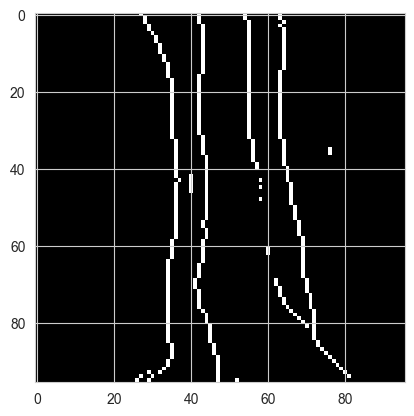

In [26]:
plt.imshow(train_images[0], cmap='gray')

(array([8859.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         357.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

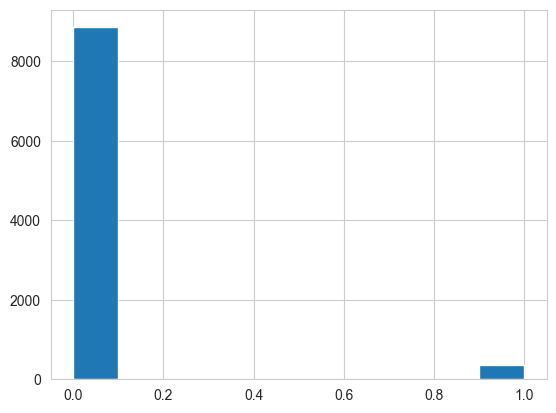

In [27]:
plt.hist(train_images[0].flatten())

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class VAE(nn.Module):
    def __init__(self, imgChannels=1, zDim=2):
        super(VAE, self).__init__()

        # Encoder
        self.encConv1 = nn.Conv2d(imgChannels, 32, kernel_size=4, stride=2, padding=1)  # Output: 50x50x32
        self.encBN1 = nn.BatchNorm2d(32)
        self.encConv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)  # Output: 25x25x64
        self.encBN2 = nn.BatchNorm2d(64)
        self.encConv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)  # Output: 12x12x128
        self.encBN3 = nn.BatchNorm2d(128)
        self.encConv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)  # Output: 6x6x256
        self.encBN4 = nn.BatchNorm2d(256)
        self.encConv5 = nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1)  # Output: 3x3x512
        self.encBN5 = nn.BatchNorm2d(512)
        self.encFC1 = nn.Linear(512*3*3, zDim)
        self.encBN6 = nn.BatchNorm1d(zDim)
        self.encFC2 = nn.Linear(512*3*3, zDim)
        self.encBN7 = nn.BatchNorm1d(zDim)

        # Decoder
        self.decFC1 = nn.Linear(zDim, 512*3*3)
        self.decBN1 = nn.BatchNorm1d(512*3*3)
        self.decConv1 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1)
        self.decBN2 = nn.BatchNorm2d(256)
        self.decConv2 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.decBN3 = nn.BatchNorm2d(128)
        self.decConv3 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.decBN4 = nn.BatchNorm2d(64)
        self.decConv4 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.decBN5 = nn.BatchNorm2d(32)
        self.decConv5 = nn.ConvTranspose2d(32, imgChannels, kernel_size=4, stride=2, padding=1)

    def encoder(self, x):
        x = F.gelu(self.encBN1(self.encConv1(x)))
        x = F.gelu(self.encBN2(self.encConv2(x)))
        x = F.gelu(self.encBN3(self.encConv3(x)))
        x = F.gelu(self.encBN4(self.encConv4(x)))
        x = F.gelu(self.encBN5(self.encConv5(x)))
        x = x.view(-1, 512*3*3)
        mu = self.encBN6(self.encFC1(x))
        logVar = self.encBN7(self.encFC2(x))
        return mu, logVar

    def reparameterize(self, mu, logVar):
        std = torch.exp(logVar / 2)
        eps = torch.randn_like(std)
        return mu + std * eps

    def decoder(self, z):
        x = F.gelu(self.decBN1(self.decFC1(z)))
        x = x.view(-1, 512, 3, 3)
        x = F.gelu(self.decBN2(self.decConv1(x)))
        x = F.gelu(self.decBN3(self.decConv2(x)))
        x = F.gelu(self.decBN4(self.decConv3(x)))
        x = F.gelu(self.decBN5(self.decConv4(x)))
        x = torch.sigmoid(self.decConv5(x))
        return x

    def forward(self, x):
        mu, logVar = self.encoder(x)
        z = self.reparameterize(mu, logVar)
        out = self.decoder(z)
        return out, mu, logVar


In [29]:
batch_size = 256

train_dataset = CustomDataset(train_images, transform=transforms.ToTensor())
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = CustomDataset(val_images, transform=transforms.ToTensor())
val_loader = DataLoader(val_dataset, batch_size=batch_size)

test_dataset = CustomDataset(test_images, transform=transforms.ToTensor())
test_loader = DataLoader(test_dataset, batch_size=batch_size)

zdim = 256

learning_rate = 1e-3
num_epochs = 100

# Initialize the modified VAE model
net = VAE(imgChannels=1, zDim=zdim).to(device)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)

# Initialize lists to store losses
train_losses = []
val_losses = []

# Initialize variable to store the minimum validation loss
min_val_loss = float('inf')
best_net = None

# Training Loop
pbar = tqdm(range(num_epochs), desc='Epoch: ', leave=True, position=0)
for epoch in range(num_epochs):
    net.train()
    train_loss = 0
    for idx, data in enumerate(train_loader, 0):
        imgs = data.float().to(device)

        # Forward
        out, mu, logVar = net(imgs)

        # Loss
        kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
        loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader.dataset)
    train_losses.append(train_loss)
    #print(f'Epoch {epoch}: Train Loss {train_loss}')

    # Validation
    net.eval()
    val_loss = 0
    with torch.no_grad():
        for idx, data in enumerate(val_loader, 0):
            imgs = data.float().to(device)
            out, mu, logVar = net(imgs)

            kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
            loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence

            val_loss += loss.item()

    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)#

    # Save model if validation loss has decreased
    if val_loss < min_val_loss:
        mmin_val_loss = val_loss
        best_net = copy.deepcopy(net)

    pbar.desc = f'Epoch: {epoch} | Train Loss: {train_loss} | Val Loss: {val_loss}'
    pbar.update(1)
pbar.close()


Epoch: 99 | Train Loss: 788.3508679391772 | Val Loss: 814.3031744648468: 100%|██████████| 100/100 [27:59<00:00, 16.79s/it] 


In [30]:
test_loss = 0
with torch.no_grad():
    for idx, data in enumerate(test_loader, 0):
        imgs = data.float().to(device)
        out, mu, logVar = best_net(imgs)
        kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
        loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence
        test_loss += loss.item()

test_loss /= len(test_loader.dataset)
print(f'Test Loss {test_loss}')

Test Loss 814.7323740514458


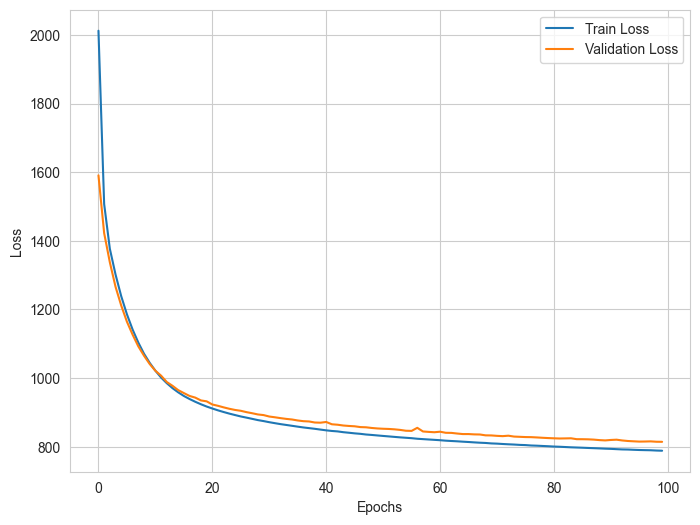

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(train_losses, label='Train Loss')
ax.plot(val_losses, label='Validation Loss')

ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')

ax.legend()

plt.show()

Reconstruction quality


Image: 100%|██████████| 256/256 [00:00<00:00, 742.67it/s]


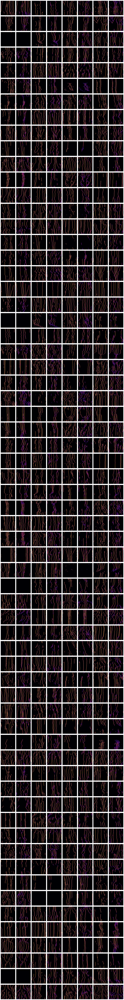

In [32]:
"""
The following part takes a random image from test loader to feed into the VAE.
Both the original image and generated image from the distribution are shown.
"""

print('Reconstruction quality')
# Show reconstruction quality
n_columns = 8  # Number of columns in the plot
n_pairs_per_row = n_columns // 2  # Number of original-reconstructed pairs per row
n_rows = (batch_size + n_pairs_per_row - 1) // n_pairs_per_row  # Calculate rows needed

best_net.eval()
with torch.no_grad():
    for idx, data in enumerate(test_loader, 0):
        imgs = data.float().to(device) # Take one batch from test_loader

        fig, axs = plt.subplots(n_rows, n_columns, figsize=(16, 2 * n_rows))

        # Forward pass through the network
        out, mu, logVAR = best_net(imgs)

        pbar = tqdm(range(batch_size), desc='Image: ', leave=True, position=0)
        for i in range(batch_size):
            row = i // n_pairs_per_row  # Calculate row index
            col = 2 * (i % n_pairs_per_row)  # Calculate column index for original image

            # Plot original image
            ax = axs[row, col]
            img = np.transpose(imgs[i].cpu().numpy(), [1, 2, 0])
            ax.imshow(np.squeeze(img), vmin=0, vmax=1, cmap='inferno')
            ax.axis('off')

            # Plot reconstructed image
            ax = axs[row, col + 1]
            outimg = np.transpose(out[i].cpu().numpy(), [1, 2, 0])
            ax.imshow(np.squeeze(outimg), vmin=0, vmax=1, cmap='inferno')
            ax.axis('off')

            pbar.update(1)
        pbar.close()

        fig.tight_layout()

        plt.show()
        plt.close()
        break

In [33]:

# Make sure the model is in evaluation mode
best_net.eval()

# DataLoader for the full dataset
full_dataset = CustomDataset(all_images, transform=transforms.ToTensor())
full_loader = DataLoader(full_dataset, batch_size=batch_size, shuffle=False)

# List to collect z-values
z_values = []

# Loop through the DataLoader
with torch.no_grad():
    pbar = tqdm(range(len(full_loader)), desc='Batch: ', leave=True, position=0)
    for idx, data in enumerate(full_loader, 0):
        imgs = data.float().to(device)
        # Forward pass to get mu and log_var
        # Forward
        out, mu, logVar = best_net(imgs)

        # Reparameterize to get z-values
        z = best_net.reparameterize(mu, logVar)

        # Detach and move to CPU, then convert to numpy array
        z = z.detach().cpu().numpy()

        # Append to list
        z_values.append(z)
        pbar.update(1)
    pbar.close()

# Flatten the list of arrays into a single numpy array
z_values_flat = np.concatenate(z_values, axis=0)

# Now, z_values_flat will contain all the z-values for the dataset in a flattened array,
# and the order will be consistent with your dataset.


Batch: 100%|██████████| 664/664 [00:18<00:00, 36.58it/s]


In [34]:

def flatten_images(image_list):
    # Flatten each image into a 1D array and stack them into a 2D array
    return np.array([img.flatten() for img in image_list])

def perform_pca(flattened_images):
    # Initialize PCA and fit the data
    pca = PCA(n_components=1)
    pca.fit(flattened_images)

    # Transform the original data to get the first two principal components
    transformed_data = pca.transform(flattened_images)

    return transformed_data

pcs = perform_pca(flatten_images(all_images))


In [35]:
reducer = umap.UMAP(min_dist=0.01, n_neighbors=100, verbose=True)
embedding = reducer.fit_transform(z_values_flat)

UMAP(min_dist=0.01, n_neighbors=100, verbose=True)
Sun Sep 17 13:57:09 2023 Construct fuzzy simplicial set
Sun Sep 17 13:57:09 2023 Finding Nearest Neighbors
Sun Sep 17 13:57:09 2023 Building RP forest with 26 trees
Sun Sep 17 13:57:21 2023 NN descent for 17 iterations
	 1  /  17
	 2  /  17
	 3  /  17
	 4  /  17
	 5  /  17
	 6  /  17
	 7  /  17
	 8  /  17
	 9  /  17
	Stopping threshold met -- exiting after 9 iterations
Sun Sep 17 13:58:17 2023 Finished Nearest Neighbor Search
Sun Sep 17 13:58:22 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Sep 17 14:00:15 2023 Finished embedding


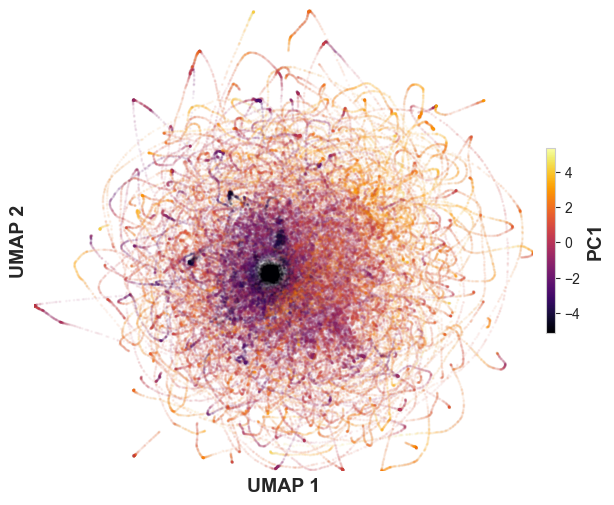

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

xlim = (np.min(embedding[:, 0]), np.max(embedding[:, 0]))
ylim = (np.min(embedding[:, 1]), np.max(embedding[:, 1]))

c = pcs[:, 0]
g = ax.scatter(embedding[:, 0], embedding[:, 1], s=1, c=c, alpha=0.05, cmap='inferno')

# Create a new ScalarMappable with the same colormap and normalization but without alpha
norm = Normalize(vmin=c.min(), vmax=c.max())
mappable = cm.ScalarMappable(norm=norm, cmap='inferno')
mappable.set_array([])

# Add colorbar based on the new ScalarMappable
cbar = fig.colorbar(mappable, ax=ax, shrink=0.4, pad=0.02, )
cbar.set_label('PC1', fontsize=14, weight='bold')

ax.set_xlabel('UMAP 1', fontsize=14 ,weight='bold')
ax.set_ylabel('UMAP 2', fontsize=14, weight='bold')

ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_xticks([])
ax.set_yticks([])

ax.set_aspect('equal')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.show()
plt.close()

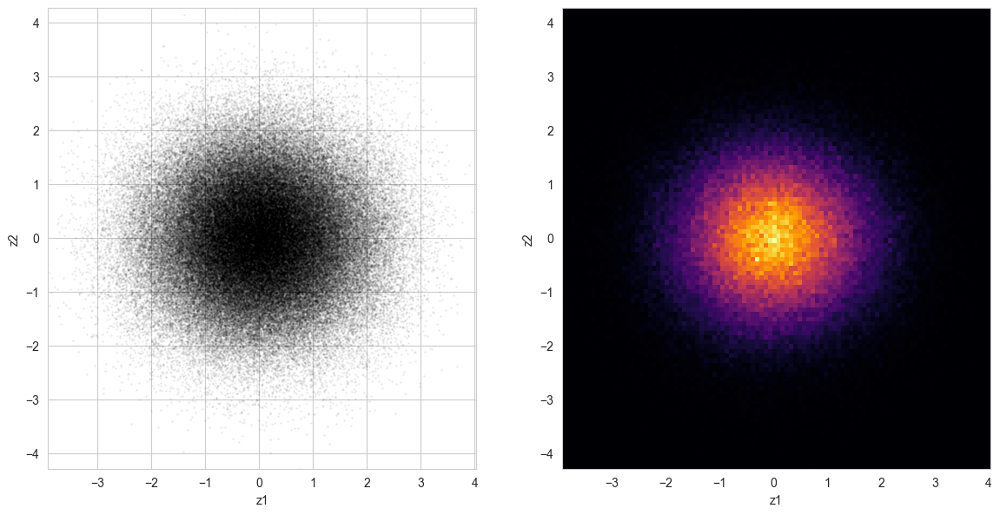

In [37]:
xlim = (np.min(z_values_flat[:, 0]), np.max(z_values_flat[:, 0]))
ylim = (np.min(z_values_flat[:, 1]), np.max(z_values_flat[:, 1]))

fig, axs = plt.subplots(1, 2, figsize=(14,14))

ax=axs[0]
ax.scatter(z_values_flat[:, 0], z_values_flat[:, 1], s=1, c='black', alpha=0.05)
ax.set_xlabel('z1')
ax.set_ylabel('z2')
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect('equal')

ax=axs[1]
ax.hist2d(z_values_flat[:, 0], z_values_flat[:, 1], bins=100, cmap='inferno')
ax.set_xlabel('z1')
ax.set_ylabel('z2')
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect('equal')

plt.show()

In [38]:
from sklearn.metrics import mean_squared_error
import numpy as np

def calculate_mse(net, full_loader):
    total_mse = 0
    total_samples = 0

    with torch.no_grad():
        pbar = tqdm(range(len(full_loader)), desc='Batch: ', leave=True, position=0)
        for idx, data in enumerate(full_loader, 0):
            imgs = data.float().to(device)
            # Forward pass to get mu and log_var
            # Forward
            reconstructed, _, _ = net(imgs)

            # Calculate MSE
            mse = mean_squared_error(data.view(data.size(0), -1).detach().cpu().numpy(),
                                     reconstructed.view(reconstructed.size(0), -1).detach().cpu().numpy())

            total_mse += mse * len(data)
            total_samples += len(data)

            pbar.update(1)
        pbar.close()

    return total_mse / total_samples

mse = calculate_mse(net, full_loader)
print(f'MSE: {mse:.6f}')

Batch: 100%|██████████| 664/664 [00:43<00:00, 15.32it/s]

MSE: 0.016652


In [40]:

def train_vae(train_loader, val_loader, test_loader, full_loader, target_dir, batch_size,
              zdim=2, learning_rate=5e-2, num_epochs=10, verbose=True,):

    # Initialize the modified VAE model
    net = VAE(imgChannels=1, zDim=zdim).to(device)
    optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)

    # Initialize ExponentialLR scheduler
    scheduler = ExponentialLR(optimizer, gamma=0.99)

    # Initialize lists to store losses
    train_losses = []
    val_losses = []

    # Initialize variable to store the minimum validation loss
    min_val_loss = float('inf')
    best_net = None

    # Training Loop
    pbar = tqdm(range(num_epochs), desc='Epoch: ', leave=True, position=0)
    for epoch in range(num_epochs):
        net.train()
        train_loss = 0
        for idx, data in enumerate(train_loader, 0):
            imgs = data.float().to(device)

            # Forward
            out, mu, logVar = net(imgs)

            # Loss
            kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
            loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        train_loss /= len(train_loader.dataset)
        train_losses.append(train_loss)
        scheduler.step() # Call the scheduler to decay the learning rate
        #print(f'Epoch {epoch}: Train Loss {train_loss}')

        # Validation
        net.eval()
        val_loss = 0
        with torch.no_grad():
            for idx, data in enumerate(val_loader, 0):
                imgs = data.float().to(device)
                out, mu, logVar = net(imgs)

                kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
                loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence

                val_loss += loss.item()

        val_loss /= len(val_loader.dataset)
        val_losses.append(val_loss)#

        # Save model if validation loss has decreased
        if val_loss < min_val_loss:
            min_val_loss = val_loss
            best_net = copy.deepcopy(net)

        pbar.desc = f'Epoch: {epoch} | Train Loss: {train_loss} | Val Loss: {val_loss}'
        pbar.update(1)
    pbar.close()

    print(f'Best Validation Loss: {min_val_loss}')

    # Test
    test_loss = 0
    with torch.no_grad():
        for idx, data in enumerate(test_loader, 0):
            imgs = data.float().to(device)
            out, mu, logVar = best_net(imgs)
            kl_divergence = 0.5 * torch.sum(-1 - logVar + mu.pow(2) + logVar.exp())
            loss = F.binary_cross_entropy(out, imgs, reduction='sum') + kl_divergence
            test_loss += loss.item()

    test_loss /= len(test_loader.dataset)
    print(f'Test Loss {test_loss}')

    # DataLoader for the full dataset
    full_dataset = CustomDataset(all_images, transform=transforms.ToTensor())
    full_loader = DataLoader(full_dataset, batch_size=batch_size, shuffle=False)

    # List to collect z-values
    z_values = []

    # Loop through the DataLoader
    with torch.no_grad():
        pbar = tqdm(range(len(full_loader)), desc='Getting Zdims: ', leave=True, position=0)
        for idx, data in enumerate(full_loader, 0):
            imgs = data.float().to(device)
            # Forward pass to get mu and log_var
            # Forward
            out, mu, logVar = best_net(imgs)

            # Reparameterize to get z-values
            z = best_net.reparameterize(mu, logVar)

            # Detach and move to CPU, then convert to numpy array
            z = z.detach().cpu().numpy()

            # Append to list
            z_values.append(z)
            pbar.update(1)
        pbar.close()

    # Flatten the list of arrays into a single numpy array
    z_values_flat = np.concatenate(z_values, axis=0)


    if verbose:

        # Plot losses
        fig, ax = plt.subplots(1, 1, figsize=(8, 6))

        ax.plot(train_losses, label='Train Loss')
        ax.plot(val_losses, label='Validation Loss')

        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')

        ax.set_title(f'Losses for VAE with zdim={zdim}')

        ax.legend()

        plt.show()
        plt.close()

        print('Reconstruction quality')
        # Show reconstruction quality
        n_columns = 8  # Number of columns in the plot
        n_pairs_per_row = n_columns // 2  # Number of original-reconstructed pairs per row
        n_rows = (batch_size + n_pairs_per_row - 1) // n_pairs_per_row  # Calculate rows needed

        best_net.eval()
        with torch.no_grad():
            for idx, data in enumerate(test_loader, 0):
                imgs = data.float().to(device) # Take one batch from test_loader

                fig, axs = plt.subplots(n_rows, n_columns, figsize=(16, 2 * n_rows))

                # Forward pass through the network
                out, mu, logVAR = best_net(imgs)

                pbar = tqdm(range(batch_size), desc='Image: ', leave=True, position=0)
                for i in range(batch_size):
                    row = i // n_pairs_per_row  # Calculate row index
                    col = 2 * (i % n_pairs_per_row)  # Calculate column index for original image

                    # Plot original image
                    ax = axs[row, col]
                    img = np.transpose(imgs[i].cpu().numpy(), [1, 2, 0])
                    ax.imshow(np.squeeze(img), vmin=0, vmax=1, cmap='inferno')
                    ax.axis('off')

                    ## if row is zero add title
                    if row == 0:
                        ax.set_title(f'real')
                        if col == 0:
                            ## add text to lower right corner
                            ax.text(0.8, 0.05, f'zdim={zdim}', horizontalalignment='right', verticalalignment='bottom', transform=ax.transAxes, color='white', fontsize=12)

                    # Plot reconstructed image
                    ax = axs[row, col + 1]
                    outimg = np.transpose(out[i].cpu().numpy(), [1, 2, 0])
                    ax.imshow(np.squeeze(outimg), vmin=0, vmax=1, cmap='inferno')
                    ax.axis('off')

                    ## if row is zero add title
                    if row == 0:
                        ax.set_title(f'recon')

                    pbar.update(1)
                pbar.close()

                fig.tight_layout()

                path_fig = os.path.join(target_dir, f'reconstructions_{zdim}.png')
                fig.savefig(path_fig, dpi=300)

                plt.show()
                plt.close()
                break

        # Now, z_values_flat will contain all the z-values for the dataset in a flattened array,
        # and the order will be consistent with your dataset.
        xlim = (np.min(z_values_flat[:, 0]), np.max(z_values_flat[:, 0]))
        ylim = (np.min(z_values_flat[:, 1]), np.max(z_values_flat[:, 1]))

        print('visualization first 2 dims')
        fig, axs = plt.subplots(1, 2, figsize=(14,14))

        ax=axs[0]
        ax.scatter(z_values_flat[:, 0], z_values_flat[:, 1], s=1, c='black', alpha=0.05)
        ax.set_xlabel('z1')
        ax.set_ylabel('z2')
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        ax.set_title(f'raw, zdim={zdim}')
        ax.set_aspect('equal')

        ax=axs[1]
        ax.hist2d(z_values_flat[:, 0], z_values_flat[:, 1], bins=100, cmap='inferno')
        ax.set_xlabel('z1')
        ax.set_ylabel('z2')
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        ax.set_title(f'2dhist, zdim={zdim}')
        ax.set_aspect('equal')

        path_fig = os.path.join(target_dir, f'z1_z2_{zdim}.png')
        fig.savefig(path_fig, dpi=300)

        plt.show()
        plt.close()

    return best_net, train_losses, val_losses, test_loss, z_values_flat

In [41]:
def flatten_images(image_list):
    # Flatten each image into a 1D array and stack them into a 2D array
    return np.array([img.flatten() for img in image_list])

def perform_pca(flattened_images):
    # Initialize PCA and fit the data
    pca = PCA(n_components=1)
    pca.fit(flattened_images)

    # Transform the original data to get the first two principal components
    transformed_data = pca.transform(flattened_images)

    return transformed_data

pcs = perform_pca(flatten_images(all_images))

batch_size = 256

train_dataset = CustomDataset(train_images, transform=transforms.ToTensor())
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = CustomDataset(val_images, transform=transforms.ToTensor())
val_loader = DataLoader(val_dataset, batch_size=batch_size)

test_dataset = CustomDataset(test_images, transform=transforms.ToTensor())
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# DataLoader for the full dataset
full_dataset = CustomDataset(all_images, transform=transforms.ToTensor())
full_loader = DataLoader(full_dataset, batch_size=batch_size, shuffle=False)

z_dims = [2, 4, 6, 8, 12, 16, 24, 32, 46, 54, 64, 96, 128]
mse_values = []

num_epochs = 200

best_nets_list, train_losses_list, val_losses_list, test_loss_list, z_values_flat_list = [], [], [], [], []
embedding_list = []

for z_dim in z_dims:
    print(f'z_dim: {z_dim}')
    best_net, train_losses, val_losses, test_loss, z_values_flat = train_vae(train_loader,
                                                                      val_loader,
                                                                      test_loader,
                                                                      full_loader,
                                                                      target_dir,
                                                                      batch_size=batch_size,
                                                                      zdim=z_dim,
                                                                      learning_rate=1e-3,
                                                                      num_epochs=num_epochs,
                                                                      verbose=True)
    mse = calculate_mse(best_net, full_loader)
    print(f'MSE: {mse} for z_dim: {z_dim}')
    mse_values.append(mse)

    best_nets_list.append(best_net)
    train_losses_list.append(train_losses)
    val_losses_list.append(val_losses)
    test_loss_list.append(test_loss)
    z_values_flat_list.append(z_values_flat)

    reducer = umap.UMAP(verbose=True, min_dist=0.01, n_neighbors=100)
    embedding = reducer.fit_transform(z_values_flat)
    embedding_list.append(embedding)

    fig, ax = plt.subplots(1, 1, figsize=(8, 6))

    xlim = (np.min(embedding[:, 0]), np.max(embedding[:, 0]))
    ylim = (np.min(embedding[:, 1]), np.max(embedding[:, 1]))

    c = pcs[:, 0]
    g = ax.scatter(embedding[:, 0], embedding[:, 1], s=1, c=c, alpha=0.05, cmap='inferno')

    # Create a new ScalarMappable with the same colormap and normalization but without alpha
    norm = Normalize(vmin=c.min(), vmax=c.max())
    mappable = cm.ScalarMappable(norm=norm, cmap='inferno')
    mappable.set_array([])

    # Add colorbar based on the new ScalarMappable
    cbar = fig.colorbar(mappable, ax=ax, shrink=0.4, pad=0.02, )
    cbar.set_label('PC1', fontsize=14, weight='bold')

    ax.set_xlabel('UMAP 1', fontsize=14, weight='bold')
    ax.set_ylabel('UMAP 2', fontsize=14, weight='bold')

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_aspect('equal')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    path_fig = os.path.join(target_dir, f'umap_zdim_{z_dim}.png')
    plt.savefig(path_fig, dpi=300, bbox_inches='tight')

    plt.show()
    plt.close()

z_dim: 2


Epoch: 131 | Train Loss: 1695.2117693691475 | Val Loss: 1691.296912804399:  66%|██████▌   | 132/200 [10:01:49<5:08:37, 272.32s/it]

KeyboardInterrupt: 

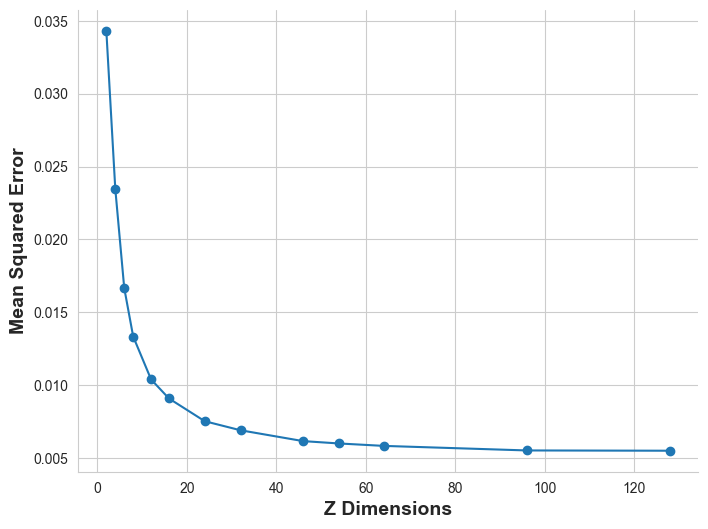

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(z_dims, mse_values, marker='o')

ax.set_xlabel('Z Dimensions', fontsize=14, weight='bold')
ax.set_ylabel('Mean Squared Error', fontsize=14, weight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

path_fig = os.path.join(target_dir, f'mse_vs_zdim.png')

plt.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show()
plt.close()

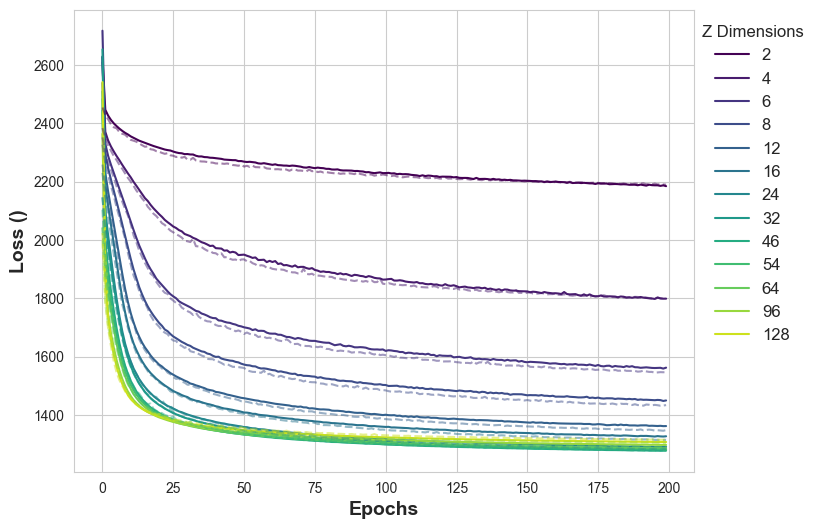

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

m = cm.ScalarMappable(cmap='viridis', norm=Normalize(vmin=0, vmax=len(z_dims)))

## train losses
for i, z_dim in enumerate(z_dims):
    c = m.to_rgba(i)
    train_losses = train_losses_list[i]
    ax.plot(train_losses, label=f'{z_dim}', c=c)

# val losses
for i, z_dim in enumerate(z_dims):
    c = m.to_rgba(i)
    val_losses = val_losses_list[i]
    ax.plot(val_losses, c=c, linestyle='--', alpha=0.5)

ax.set_xlabel('Epochs', fontsize=14, weight='bold')
ax.set_ylabel('Loss', fontsize=14, weight='bold')

ax.legend(fontsize=12, loc='upper right', bbox_to_anchor=(1.2, 1), frameon=False,
          title='Z Dimensions', title_fontsize=12)

path_fig = os.path.join(target_dir, f'losses.png')
plt.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show()
plt.close()